In [1]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Import the FOOOF object
from fooof import FOOOF
from fooof import FOOOFGroup

# Import a utility to download and load example data
from fooof.utils.download import load_fooof_data

import mne
import numpy as np
import os
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from spiketools.plts.utils import make_axes
from math import floor
import random
from scipy import stats

import imagesc as imagesc
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

import glob

In [2]:
# get all Sleep staging files
staging_files = '/home/b1044271/EEGsleep/SleepStaging/*.txt'
stage_files = glob.glob(staging_files)

# get all FOOOF parameters files
path_files = '/home/b1044271/Columbia/Results/Time-resolved/E257/*.npy'
aperiodic_files = glob.glob(path_files)

In [3]:
# Adjust sampling rate of sleep stages
def resample_stages(path_file, new_samp_rate):
    stage_file = pd.read_csv(path_file)
    #set required time resolution - stages are in 30 seconds so the conversion depends on the time resolution specified
    cov_eq = 30/new_samp_rate
    stages = list(stage_file.iloc[:,0])
    stages_n = [val for val in stages for _ in range(0, floor(cov_eq))]
    return(stages_n)

sfiles = np.zeros([17,50000])*np.nan
i=0
for X in stage_files:
    x  = resample_stages(X, 2)
    sfiles[i,0:len(x)] = x
    i=i+1

In [4]:
t          = 2 #time window we use for FOOOF
intrvl     = 30 #length of the intercal we want to look at before and after transition point (in datapoints)
b          = [1,2,3] #NREM stages

# Get exponent per epoch of sleep stage 

In [15]:
i = 0

N1e = np.zeros([17,1000])*np.nan
N2e = np.zeros([17,1000])*np.nan
N3e = np.zeros([17,1000])*np.nan
RMe = np.zeros([17,1000])*np.nan 
WKe = np.zeros([17,1000])*np.nan 

N1a = np.zeros([17,5000])*np.nan
N2a = np.zeros([17,5000])*np.nan
N3a = np.zeros([17,5000])*np.nan
RMa = np.zeros([17,5000])*np.nan 
WKa = np.zeros([17,5000])*np.nan 

N1z = np.zeros([17,5000])*np.nan
N2z = np.zeros([17,5000])*np.nan
N3z = np.zeros([17,5000])*np.nan
RMz = np.zeros([17,5000])*np.nan 
WKz = np.zeros([17,5000])*np.nan 

A = np.load(aperiodic_files[0])
for x in np.arange(17):
    Stage = pd.read_csv(stage_files[x]) # load sleep stages
    param = A[x] # load parameter array
     
    # This section deals with the different stages
    N1_o1 = np.where(np.isin(Stage, 1))[0] # get  epochs 
    N2_o1 = np.where(np.isin(Stage, 2))[0] # get  epochs 
    N3_o1 = np.where(np.isin(Stage, 3))[0] # get  epochs        
    RM_o1 = np.where(np.isin(Stage, 5))[0] # get  epochs 
    WK_o1 = np.where(np.isin(Stage, 0))[0] # get  epochs 
    
    N1a[i, 0:len(N1_o1)] = param[N1_o1]
    N2a[i, 0:len(N2_o1)] = param[N2_o1]
    N3a[i, 0:len(N3_o1)] = param[N3_o1]
    RMa[i, 0:len(RM_o1)] = param[RM_o1]
    WKa[i, 0:len(WK_o1)] = param[WK_o1]

    i =i+1

In [16]:
# Plot avergaed exponent values through the night
N1za = np.nanmean(N1a,0)
N1zb = N1za[~np.isnan(N1za)]

N2za = np.nanmean(N2a,0)
N2zb = N2za[~np.isnan(N2za)]

N3za = np.nanmean(N3a,0)
N3zb = N3za[~np.isnan(N3za)]

RMza = np.nanmean(RMa,0)
RMzb = RMza[~np.isnan(RMza)]

WKza = np.nanmean(WKa,0)
WKzb = WKza[~np.isnan(WKza)]

#find line of best fit
a1, b1 = np.polyfit(np.arange(len(N1zb)), N1zb, 1)
a2, b2 = np.polyfit(np.arange(len(N2zb)), N2zb, 1)
a3, b3 = np.polyfit(np.arange(len(N3zb)), N3zb, 1)
a4, b4 = np.polyfit(np.arange(len(RMzb)), RMzb, 1)
a5, b5 = np.polyfit(np.arange(len(WKzb)), WKzb, 1)

plt.figure(figsize=(25, 10), dpi=600)
# Plotting
plt.scatter(np.arange(len(N1zb)),N1zb, color = 'grey', s =5)
plt.scatter(np.arange(len(N2zb)),N2zb, color = 'orange', s =5)
plt.scatter(np.arange(len(N3zb)),N3zb, color = 'green', s =5)
plt.scatter(np.arange(len(RMzb)),RMzb, color = 'r', s =5)
plt.scatter(np.arange(len(WKzb)),WKzb, color = 'b', s =5)

plt.plot(np.arange(len(WKzb)), a5*np.arange(len(WKzb))+b5,color = 'b',label='W', linewidth = 3)
plt.plot(np.arange(len(N1zb)), a1*np.arange(len(N1zb))+b1,color = 'grey',label='N1', linewidth = 3)
plt.plot(np.arange(len(N2zb)), a2*np.arange(len(N2zb))+b2,color = 'orange',label='N2', linewidth = 3)
plt.plot(np.arange(len(N3zb)), a3*np.arange(len(N3zb))+b3,color = 'green',label='N3', linewidth = 3)
plt.plot(np.arange(len(RMzb)), a4*np.arange(len(RMzb))+b4,color = 'r',label='REM', linewidth = 3)

plt.legend(fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel('exponent',fontsize=24)
plt.xlabel('epoch order',fontsize=24)
plt.title('Exponent through the night - normalized - all epochs', fontsize = 20)

#plt.savefig("/home/b1044271/Columbia/Plots/exponent_thru_night_norm_all.svg", dpi = 600)

Text(0.5, 1.0, 'Exponent through the night - normalized - all epochs')

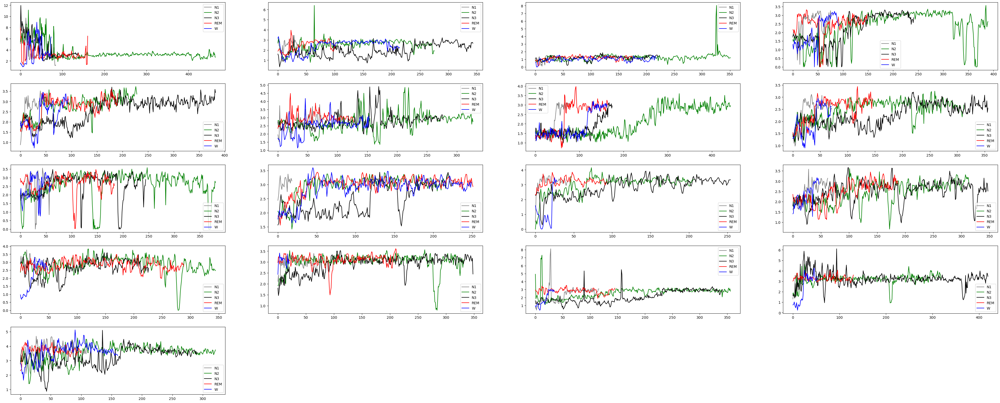

In [17]:
# Plot subject level exponent values
i=0
fig = plt.figure(figsize=(50, 20))    
#fig.subplots_adjust(hspace=0.5, wspace=0.7)

for i in np.arange(17):
    
    ax = fig.add_subplot(5,4, i+1)
    ax.plot(N1a[i,:], 'grey' , label='N1')
    ax.plot(N2a[i,:],'green', label='N2')
    ax.plot(N3a[i,:], 'k', label='N3')
    ax.plot(RMa[i,:], 'r', label='REM')        
    ax.plot(WKa[i,:], 'b', label='W')  
    
    plt.legend(fontsize=10)

In [18]:
# get the same number of epochs for all subjects
#################################################
N1nn=np.zeros(17)*np.nan
N2nn=np.zeros(17)*np.nan
N3nn=np.zeros(17)*np.nan
RMnn=np.zeros(17)*np.nan
WKnn=np.zeros(17)*np.nan

for i in np.arange(17):
    x1 = N1a[i,]
    N1nn[i] = len(x1[~np.isnan(x1)])
    x2 = N2a[i,]
    N2nn[i] = len(x2[~np.isnan(x2)])
    x3 = N3a[i,]
    N3nn[i] = len(x3[~np.isnan(x3)])
    x4 = RMa[i,]
    RMnn[i] = len(x4[~np.isnan(x4)])
    x5 = WKa[i,]
    WKnn[i] = len(x5[~np.isnan(x5)])
    
mN1 = min(N1nn)
mN2 = min(N2nn)
mN3 = min(N3nn)
mRM = min(RMnn)
mWK = min(WKnn)

N1z2 = np.delete(N1a, slice(int(mN1+1),5000), 1)  # delete second row of A
N2z2 = np.delete(N2a, slice(int(mN2+1),5000), 1)  # delete second row of A
N3z2 = np.delete(N3a, slice(int(mN3+1),5000), 1)  # delete second row of A
RMz2 = np.delete(RMa, slice(int(mRM+1),5000), 1)  # delete second row of A
WKz2 = np.delete(WKa, slice(int(mWK+1),5000), 1)  # delete second row of A


In [19]:
# Z scorre
N1z3=np.zeros([17,int(mN1)+1])*np.nan
N2z3=np.zeros([17,int(mN2)+1])*np.nan
N3z3=np.zeros([17,int(mN3)+1])*np.nan
RMz3=np.zeros([17,int(mRM)+1])*np.nan
WKz3=np.zeros([17,int(mWK)+1])*np.nan 

for i in np.arange(17):
    N1z3[i, 0:int(mN1)+1] = stats.zscore(N1z2[i,])
    N2z3[i, 0:int(mN2)+1] = stats.zscore(N2z2[i,])
    N3z3[i, 0:int(mN3)+1] = stats.zscore(N3z2[i,])
    RMz3[i, 0:int(mRM)+1] = stats.zscore(RMz2[i,])
    WKz3[i, 0:int(mWK)+1] = stats.zscore(WKz2[i,])

In [20]:
N1za = np.nanmean(N1z3,0)
N1zb = N1za[~np.isnan(N1za)]

N2za = np.nanmean(N2z3,0)
N2zb = N2za[~np.isnan(N2za)]

N3za = np.nanmean(N3z3,0)
N3zb = N3za[~np.isnan(N3za)]

RMza = np.nanmean(RMz3,0)
RMzb = RMza[~np.isnan(RMza)]

WKza = np.nanmean(WKz3,0)
WKzb = WKza[~np.isnan(WKza)]




#find line of best fit
a1, b1 = np.polyfit(np.arange(len(N1zb)), N1zb, 1)
a2, b2 = np.polyfit(np.arange(len(N2zb)), N2zb, 1)
a3, b3 = np.polyfit(np.arange(len(N3zb)), N3zb, 1)
a4, b4 = np.polyfit(np.arange(len(RMzb)), RMzb, 1)
a5, b5 = np.polyfit(np.arange(len(WKzb)), WKzb, 1)

plt.figure(figsize=(20, 10), dpi=600)
# Plotting
plt.scatter(np.arange(len(N1zb)),N1zb, color = 'grey', s =25)
plt.scatter(np.arange(len(N2zb)),N2zb, color = 'orange', s =25)
plt.scatter(np.arange(len(N3zb)),N3zb, color = 'green', s =25)
plt.scatter(np.arange(len(RMzb)),RMzb, color = 'r', s =25)
plt.scatter(np.arange(len(WKzb)),WKzb, color = 'b', s =25)

plt.plot(np.arange(len(WKzb)), a5*np.arange(len(WKzb))+b5,color = 'b',label='W', linewidth = 5)
plt.plot(np.arange(len(N1zb)), a1*np.arange(len(N1zb))+b1,color = 'grey',label='N1', linewidth = 5)
plt.plot(np.arange(len(N2zb)), a2*np.arange(len(N2zb))+b2,color = 'orange',label='N2', linewidth = 5)
plt.plot(np.arange(len(N3zb)), a3*np.arange(len(N3zb))+b3,color = 'green',label='N3', linewidth = 5)
plt.plot(np.arange(len(RMzb)), a4*np.arange(len(RMzb))+b4,color = 'r',label='REM', linewidth = 5)

plt.legend(fontsize=40)
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.ylabel('exponent (z-score)',fontsize=40)
plt.xlabel('epoch number',fontsize=40)
plt.title('Exponent through the night - normalized - Min epochs / stage', fontsize = 40)

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
ax.spines['bottom'].set_linewidth(3.5)
ax.spines['left'].set_linewidth(3.5)

plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_exponent_thru_night.svg", dpi = 600)

# SLEEP CYCLES

In [358]:
i = 0

N1a = np.zeros([4,17,1000])*np.nan
N2a = np.zeros([4,17,1000])*np.nan
N3a = np.zeros([4,17,1000])*np.nan
RMa = np.zeros([4,17,1000])*np.nan 
WKa = np.zeros([4,17,1000])*np.nan 

ALL = np.zeros([4,17,2000])*np.nan 

A = np.load(aperiodic_files[0])
for x in np.arange(17):
    Stage = pd.read_csv(stage_files[x]) # load sleep stages
    param = A[x] # load parameter array
    
    tr_min = min(len(Stage), len(param))
    Stagea = Stage[0:tr_min]
    parama = param[0:tr_min]
    
    # find the midpoint of the night
    MidN  = int(len(Stagea)/4)
    
    param1 = parama[0: MidN]
    param2 = parama[MidN:MidN*2]
    param3 = parama[MidN*2:MidN*3]
    param4 = parama[MidN*3:MidN*4]
    
    Stage1 = Stagea[0: MidN]
    Stage2 = Stagea[MidN:MidN*2]
    Stage3 = Stagea[MidN*2:MidN*3]
    Stage4 = Stagea[MidN*3:MidN*4]    
    
    Stage_All = [Stage1,Stage2,Stage3,Stage4]
    param_All = [param1,param2,param3,param4]

    c = 0
    for ii in np.arange(4):
        # This section deals with the different stages
        N1_o1 = np.where(np.isin(Stage_All[ii], 1))[0] # get  epochs 
        N2_o1 = np.where(np.isin(Stage_All[ii], 2))[0] # get  epochs 
        N3_o1 = np.where(np.isin(Stage_All[ii], 3))[0] # get  epochs        
        RM_o1 = np.where(np.isin(Stage_All[ii], 5))[0] # get  epochs 
        WK_o1 = np.where(np.isin(Stage_All[ii], 0))[0] # get  epochs 
        
        X = min(len(N1_o1), len(N2_o1), len(N3_o1), len(RM_o1), len(WK_o1))
        N1_o1a = random.sample(sorted(N1_o1), X)
        N2_o1a = random.sample(sorted(N2_o1), X)    
        N3_o1a = random.sample(sorted(N3_o1), X)            
        RM_o1a = random.sample(sorted(RM_o1), X)
        WK_o1a = random.sample(sorted(WK_o1), X)            
        
        N1a[c,i, 0:len(N1_o1a)] = param_All[ii][N1_o1a]
        N2a[c,i, 0:len(N2_o1a)] = param_All[ii][N2_o1a]
        N3a[c,i, 0:len(N3_o1a)] = param_All[ii][N3_o1a]
        RMa[c,i, 0:len(RM_o1a)] = param_All[ii][RM_o1a]
        WKa[c,i, 0:len(WK_o1a)] = param_All[ii][WK_o1a]
        
        ALL[c,i, 0:len(N1_o1a)*5] = np.concatenate((param_All[ii][N1_o1a], param_All[ii][N2_o1a], param_All[ii][N3_o1a],
                                                    param_All[ii][RM_o1a],param_All[ii][WK_o1a]), axis = 0)
        N1_o1=[]
        N2_o1=[]
        N3_o1=[]
        RM_o1=[]
        WK_o1=[]
        N1_o1a=[]
        N2_o1a=[]
        N3_o1a=[]
        RM_o1a=[]
        WK_o1a=[]
        c=c+1

    i =i+1

In [359]:
np.shape(ALL)

(4, 17, 2000)

In [280]:
# get the same number of epochs for all subjects per stage (Problematic here)
#################################################
N1nn=np.zeros(17)*np.nan
N2nn=np.zeros(17)*np.nan
N3nn=np.zeros(17)*np.nan
RMnn=np.zeros(17)*np.nan
WKnn=np.zeros(17)*np.nan

for ii in np.arange(4):
    for i in np.arange(17):
        x1 = N1a[ii,i,]
        N1nn[i] = len(x1[~np.isnan(x1)])
        x2 = N2a[ii,i,]
        N2nn[i] = len(x2[~np.isnan(x2)])
        x3 = N3a[ii,i,]
        N3nn[i] = len(x3[~np.isnan(x3)])
        x4 = RMa[ii,i,]
        RMnn[i] = len(x4[~np.isnan(x4)])
        x5 = WKa[ii,i]
        WKnn[i] = len(x5[~np.isnan(x5)])
    
    mN1a = min(N1nn)
    mN2a = min(N2nn)
    mN3a = min(N3nn)
    mRMa = min(RMnn)
    mWKa = min(WKnn)
    
    N1z2[ii,:,0:int(mN1a)] = N1a[ii,:,0:int(mN1a)]
    N2z2[ii,:,0:int(mN2a)] = N2a[ii,:,0:int(mN2a)]
    N3z2[ii,:,0:int(mN3a)] = N3a[ii,:,0:int(mN3a)]
    RMz2[ii,:,0:int(mRMa)] = RMa[ii,:,0:int(mRMa)]
    WKz2[ii,:,0:int(mWKa)] = WKa[ii,:,0:int(mWKa)]


# PLOTTING (4 subplots for 4 cycles)

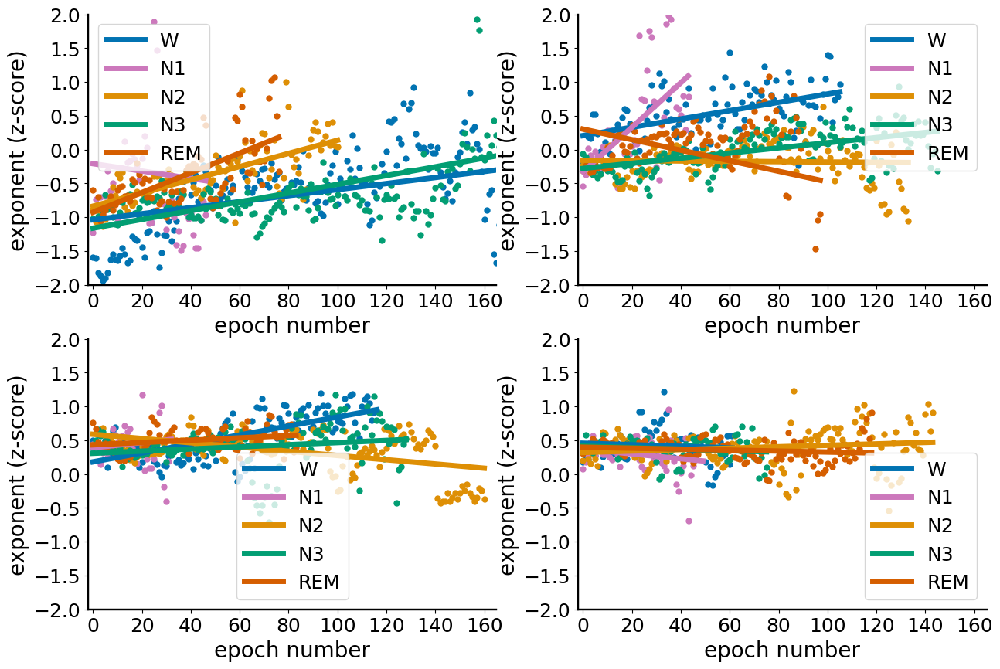

In [288]:
import seaborn
ColStage = [seaborn.color_palette("colorblind")[0], seaborn.color_palette("colorblind")[4],seaborn.color_palette("colorblind")[1], 
        seaborn.color_palette("colorblind")[2],seaborn.color_palette("colorblind")[3]]

fig = plt.figure(figsize=(15, 10))  

for i in np.arange(4):

    ax = fig.add_subplot(2, 2, i+1)

    N1za = np.nanmean(N1a[i,:,:],0)
    N1zb = N1za[~np.isnan(N1za)]

    N2za = np.nanmean(N2a[i,:,:],0)
    N2zb = N2za[~np.isnan(N2za)]

    N3za = np.nanmean(N3a[i,:,:],0)
    N3zb = N3za[~np.isnan(N3za)]

    RMza = np.nanmean(RMa[i,:,:],0)
    RMzb = RMza[~np.isnan(RMza)]

    WKza = np.nanmean(WKa[i,:,:],0)
    WKzb = WKza[~np.isnan(WKza)]

    #find line of best fit
    a1, b1 = np.polyfit(np.arange(len(N1zb)), N1zb, 1)
    a2, b2 = np.polyfit(np.arange(len(N2zb)), N2zb, 1)
    a3, b3 = np.polyfit(np.arange(len(N3zb)), N3zb, 1)
    a4, b4 = np.polyfit(np.arange(len(RMzb)), RMzb, 1)
    a5, b5 = np.polyfit(np.arange(len(WKzb)), WKzb, 1)

    # Plotting
    plt.scatter(np.arange(len(WKzb)),WKzb, color = ColStage[0], s =25)
    plt.scatter(np.arange(len(N1zb)),N1zb, color = ColStage[1], s =25)
    plt.scatter(np.arange(len(N2zb)),N2zb, color = ColStage[2], s =25)
    plt.scatter(np.arange(len(N3zb)),N3zb, color = ColStage[3], s =25)
    plt.scatter(np.arange(len(RMzb)),RMzb, color = ColStage[4], s =25)

    plt.plot(np.arange(len(WKzb)), a5*np.arange(len(WKzb))+b5,color = ColStage[0],label='W', linewidth = 5)
    plt.plot(np.arange(len(N1zb)), a1*np.arange(len(N1zb))+b1,color = ColStage[1],label='N1', linewidth = 5)
    plt.plot(np.arange(len(N2zb)), a2*np.arange(len(N2zb))+b2,color = ColStage[2],label='N2', linewidth = 5)
    plt.plot(np.arange(len(N3zb)), a3*np.arange(len(N3zb))+b3,color = ColStage[3],label='N3', linewidth = 5)
    plt.plot(np.arange(len(RMzb)), a4*np.arange(len(RMzb))+b4,color = ColStage[4],label='REM', linewidth = 5)

    plt.legend(fontsize=18)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.ylabel('exponent (z-score)',fontsize=20)
    plt.xlabel('epoch number',fontsize=20)
    #plt.title(, fontsize = 40)
    plt.xlim(-2, 165)
    plt.ylim(-2, 2)
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    #ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
    ax.spines['bottom'].set_linewidth(1.75)
    ax.spines['left'].set_linewidth(1.75)

#plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_exponent_thru_night.svg", dpi = 600)

## PLOT AVERAGES

In [ ]:
# get the same number of epochs for all stages per subject
#################################################
N1nn=np.zeros(17)*np.nan
N2nn=np.zeros(17)*np.nan
N3nn=np.zeros(17)*np.nan
RMnn=np.zeros(17)*np.nan
WKnn=np.zeros(17)*np.nan

for ii in np.arange(4):
    for i in np.arange(17):
        x1 = N1a[ii,i,]
        N1nn[i] = len(x1[~np.isnan(x1)])
        x2 = N2a[ii,i,]
        N2nn[i] = len(x2[~np.isnan(x2)])
        x3 = N3a[ii,i,]
        N3nn[i] = len(x3[~np.isnan(x3)])
        x4 = RMa[ii,i,]
        RMnn[i] = len(x4[~np.isnan(x4)])
        x5 = WKa[ii,i]
        WKnn[i] = len(x5[~np.isnan(x5)])
    
    mALL = min(np.concatenate((N1nn, N2nn,N3nn, RMnn, WKnn),0))

    
    N1z2[ii,i,0:int(mALL)] = x1[0:int(mN1a)]
    N2z2[ii,i,0:int(mALL)] = x2[0:int(mN2a)]
    N3z2[ii,i,0:int(mALL)] = x3[0:int(mN3a)]
    RMz2[ii,i,0:int(mALL)] = x4[0:int(mRMa)]
    WKz2[ii,i,0:int(mALL)] = x5[0:int(mWKa)]


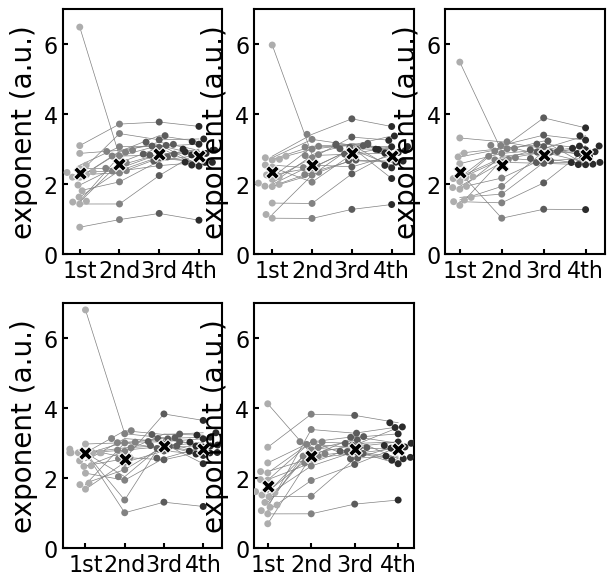

In [341]:
import seaborn
ColStage = [seaborn.color_palette("Greys")[2], seaborn.color_palette("Greys")[3],
        seaborn.color_palette("Greys")[4],seaborn.color_palette("Greys")[5]]

titles =  ['1st','2nd', '3rd','4th']
fig = plt.figure(figsize=(7, 7))  

All_stages = [N1a,N2a,N3a,RMa,WKa]
alphas = np.linspace(0.1, 1, 5)
weights = np.arange(1, 6)
i=0
for x in All_stages:

    ax = fig.add_subplot(2, 3, i+1)

    s1za = np.nanmean(x[0,:,:],1)
    s1za[np.isnan(s1za)] = np.nanmean(s1za)

    s2za = np.nanmean(x[1,:,:],1)
    s2za[np.isnan(s2za)] = np.nanmean(s2za)

    s3za = np.nanmean(x[2,:,:],1)
    s3za[np.isnan(s3za)] = np.nanmean(s3za)

    s4za = np.nanmean(x[3,:,:],1)
    s4za[np.isnan(s4za)] = np.nanmean(s4za)

    
    array_list = [s1za, s2za,s3za, s4za]
    
    Col = ColStage[0]
    
    
    # Plotting
    ax = seaborn.swarmplot(data= array_list, palette = ColStage)
    plt.ylabel(titles, fontsize = 20)
    ax.set_xticklabels(titles, fontsize = 20)
    seaborn.scatterplot(x=[0,1,2,3], y=[np.nanmean(array_list[0]),np.nanmean(array_list[1]),np.nanmean(array_list[2]),
                                          np.nanmean(array_list[3])]
                                          , marker='X', color='black', s=100, zorder=4, legend=False);
    plt.plot([array_list[0], array_list[1], array_list[2], array_list[3]], color = 'grey', linewidth = 0.5);
   
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.ylabel('exponent (a.u.)', fontsize=20)
    
    plt.ylim([0, 7])

    ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['right'].set_linewidth(1.5)
    ax.spines['top'].set_linewidth(1.5)
    
    i=i+1
plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_sleep_cycles.svg", dpi = 600)

## Plot average of cycles over all stages

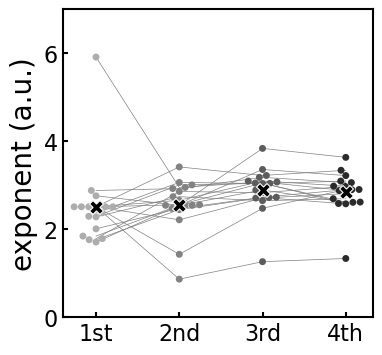

In [362]:
import seaborn
ColStage = [seaborn.color_palette("Greys")[2], seaborn.color_palette("Greys")[3],
        seaborn.color_palette("Greys")[4],seaborn.color_palette("Greys")[5]]

titles =  ['1st','2nd', '3rd','4th']

fig = plt.figure(figsize=(4, 4))  


s1za = np.nanmean(ALL[0,:,:],1)
s1za[np.isnan(s1za)] = np.nanmean(s1za)

s2za = np.nanmean(ALL[1,:,:],1)
s2za[np.isnan(s2za)] = np.nanmean(s2za)

s3za = np.nanmean(ALL[2,:,:],1)
s3za[np.isnan(s3za)] = np.nanmean(s3za)

s4za = np.nanmean(ALL[3,:,:],1)
s4za[np.isnan(s4za)] = np.nanmean(s4za)

    
array_list = [s1za, s2za,s3za, s4za]
    
Col = ColStage[0]
    
    
# Plotting
ax = seaborn.swarmplot(data= array_list, palette = ColStage)
plt.ylabel(titles, fontsize = 20)
ax.set_xticklabels(titles, fontsize = 20)
seaborn.scatterplot(x=[0,1,2,3], y=[np.nanmean(array_list[0]),np.nanmean(array_list[1]),np.nanmean(array_list[2]),
                                          np.nanmean(array_list[3])]
                                          , marker='X', color='black', s=100, zorder=4, legend=False);
plt.plot([array_list[0], array_list[1], array_list[2], array_list[3]], color = 'grey', linewidth = 0.5);
   
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('exponent (a.u.)', fontsize=20)
    
plt.ylim([0, 7])

ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_linewidth(1.5)
ax.spines['right'].set_linewidth(1.5)
ax.spines['top'].set_linewidth(1.5)
    

#plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_sleep_cycles.svg", dpi = 600)

# 30s epochs

In [385]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
# Import the FOOOF object
from fooof import FOOOF
from fooof import FOOOFGroup
# Import a utility to download and load example data
from fooof.utils.download import load_fooof_data
from pathlib import Path
import glob
from math import floor


In [386]:
# get the staging list
path_stage = Path('/home/b1044271/EEGsleep/SleepStaging/mat/mne2/')
stage_files = os.listdir(path_stage)
stage_files = [file for file in stage_files]
stage_files = sorted(stage_files)

# get the subjects list
Data_path = '/home/b1044271/Columbia/Preprocessed/Better_ica/'
subj_files = os.listdir(Data_path)
subj_files = [file for file in subj_files]
subj_files = sorted(subj_files)

# Create path for results
path_results = Path('/home/b1044271/Columbia/Results/Time-resolved/ALL_electrodes/')

In [413]:
# select electrodes (if empty, uses all electrodes)
electrode = 'E257'

# Set parameters for calculating
t     = 15 #in seconds
f_min =  1 # maximum frequency
f_max =  45 # maximum frequency
fs    = 250 #sampling freq

# Settings for the frequency calculations (Welch's method)
SETTINGS_B  = { 'method' : 'welch', 'average' : 'mean', 'fmin' :f_min , 'fmax':f_max, 'n_fft': fs*t}

# FOOF settings
SETTINGS_F1={'max_n_peaks':8, 'aperiodic_mode':'fixed'}
SETTINGS_F2={'max_n_peaks':8, 'aperiodic_mode':'knee'}

# Helper function for paths
def check_path(path):
    if not os.path.exists(path):
        os.mkdir(path)

# Vectors for storing results per subject
Slope_nk = np.zeros([5,17,1000])* np.nan
Slope_k = np.zeros([5,17,1000])* np.nan

Knee_k = np.zeros([5,17,1000])* np.nan

Slope_k_fullnight = np.zeros([17,10000])* np.nan
Slope_nk_fullnight = np.zeros([17,10000])* np.nan

Knee_k_fullnight = np.zeros([17,10000])* np.nan

# START
i= 0
for S in subj_files:
    EEG = mne.io.read_raw_eeglab(os.path.join(Data_path, S)) # read raw .set file
    print('loaded')
      
    EEG = EEG.pick(electrode, exclude=[]) # select Cz for further analysis
    events = mne.read_events(Path(path_stage, stage_files[i])) #read staging markers
    epochs = mne.Epochs(EEG, events=events, tmin=-30, tmax=0)
    
    # The whole night
    ALL_psd = epochs.compute_psd(**SETTINGS_B) #N1
    
    fm1 = FOOOFGroup(**SETTINGS_F1)
    fm2 = FOOOFGroup(**SETTINGS_F2)

    fm1.fit(ALL_psd._freqs, np.squeeze(ALL_psd._data), [ALL_psd._freqs[0] , ALL_psd._freqs[-1]])
    fm1.save(S[0:4] + 'ALLNight_NK',  file_path = path_results / S[0:4], save_results=True)

    fm2.fit(ALL_psd._freqs, np.squeeze(ALL_psd._data), [ALL_psd._freqs[0] , ALL_psd._freqs[-1]])
    fm2.save(S[0:4] + 'ALLNight_K',  file_path = path_results / S[0:4], save_results=True)
    
    
    Slope_nk_fullnight[i, 0:len(fm1.get_params('aperiodic_params','exponent'))] = fm1.get_params('aperiodic_params','exponent')
    Slope_k_fullnight[i, 0:len(fm2.get_params('aperiodic_params','exponent'))] = fm2.get_params('aperiodic_params','exponent')
    Knee_k_fullnight[i, 0:len(fm2.get_params('aperiodic_params','knee'))] = fm2.get_params('aperiodic_params','knee')
             
    
# Frequency transformation welch's method from 1 to 70Hz different time stamps
    #Now we select epochs and average over all epochs
    N1s = epochs['1']
    N2s = epochs['2']
    N3s = epochs['3']
    RMs = epochs['5']
    AWs = epochs['0']

   # Settings for PSD calculation using welch's
    N1={}
    N2={}
    N3={}
    AW={}
    RM={}
    
    # Calculate PSD per stage
    N1_psd = N1s.compute_psd(**SETTINGS_B) #N1
    N2_psd = N2s.compute_psd(**SETTINGS_B) #N2
    N3_psd = N3s.compute_psd(**SETTINGS_B)
    AW_psd = AWs.compute_psd(**SETTINGS_B)
    RM_psd = RMs.compute_psd(**SETTINGS_B)

    
    stages = [N1_psd, N2_psd, N3_psd, AW_psd, RM_psd]
    names_NK  = ['_NK_N1_30s', '_NK_N2_30s', '_NK_N3_30s', '_NK_AW_30s', '_NK_RM_30s']
    names_K  = ['_K_N1_30s', '_K_N2_30s', '_K_N3_30s', '_K_AW_30s', '_K_RM_30s']
   
    ix=0
    for X in stages:
    
    # FOOFGroup to add paramters from all channels
        #fm1 = FOOOFGroup(**SETTINGS_F1)
        fm2 = FOOOFGroup(**SETTINGS_F2)

        #fm1.fit(X._freqs, np.squeeze(X._data), [X._freqs[0] , X._freqs[-1]])
        #fm1.save(S[0:4] + names_NK[ix],  file_path = path_results / S[0:4], save_results=True)

        fm2.fit(X._freqs, np.squeeze(X._data), [X._freqs[0] , X._freqs[-1]])
        fm2.save(S[0:4] + names_K[ix],  file_path = path_results / S[0:4], save_results=True)
    
    
        #Slope_nk[ix,i, 0:len(fm1.get_params('aperiodic_params','exponent'))] = fm1.get_params('aperiodic_params','exponent')
        #Slope_k[ix,i, 0:len(fm2.get_params('aperiodic_params','exponent'))] = fm2.get_params('aperiodic_params','exponent')
        Knee_k[ix,i, 0:len(fm2.get_params('aperiodic_params','knee'))] = fm2.get_params('aperiodic_params','knee')
        
        # loop over stages 
        ix=ix+1
    #loop over subjects
    i = i+1


loaded
Not setting metadata
927 matching events found
Setting baseline interval to [-30.0, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 927 events and 7501 original time points ...
2 bad epochs dropped
Effective window size : 15.000 (s)
Running FOOOFGroup across 925 power spectra.
Model fitting was unsuccessful.
Running FOOOFGroup across 925 power spectra.
Using data from preloaded Raw for 85 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 465 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 140 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 74 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 161 events and 7501 original time points ...
Effective window size : 15.000 (s)
Runn

Running FOOOFGroup across 174 power spectra.
Running FOOOFGroup across 164 power spectra.
Running FOOOFGroup across 166 power spectra.
loaded
Not setting metadata
961 matching events found
Setting baseline interval to [-30.0, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 961 events and 7501 original time points ...
2 bad epochs dropped
Effective window size : 15.000 (s)
Running FOOOFGroup across 959 power spectra.
Running FOOOFGroup across 959 power spectra.
Using data from preloaded Raw for 72 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 313 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 357 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 71 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from

Running FOOOFGroup across 72 power spectra.
Running FOOOFGroup across 333 power spectra.
Running FOOOFGroup across 349 power spectra.
Running FOOOFGroup across 21 power spectra.
Running FOOOFGroup across 213 power spectra.
loaded
Not setting metadata
1001 matching events found
Setting baseline interval to [-30.0, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1001 events and 7501 original time points ...
2 bad epochs dropped
Effective window size : 15.000 (s)
Running FOOOFGroup across 999 power spectra.
Running FOOOFGroup across 999 power spectra.
Using data from preloaded Raw for 116 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 357 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 343 events and 7501 original time points ...
Effective window size : 15.000 (s)
Using data from preloaded Raw for 37 

In [419]:
# saving the results in numpy files
#np.save(str(path_results) +  '/'  + 'Slope_nk_mean_30s',Slope_nk)
#np.save(str(path_results) +  '/'  + 'Slope_k_mean_30s',Slope_k)
#np.save(str(path_results) +  '/'  + 'r2_k_mean_30s',r2_k)
#np.save(str(path_results) +  '/'  + 'r2_nk_mean_30s',r2_nk)
#np.save(str(path_results) +  '/'  + 'Knee_k_mean_30s',Knee_k)
#np.save(str(path_results) +  '/'  + 'Offset_nk_mean_30s',Off_nk)
#np.save(str(path_results) +  '/'  + 'Offset_k_mean_30s',Off_k)
#np.save(str(path_results) +  '/'  + 'Error_nk_mean_30s',E_nk)
#np.save(str(path_results) +  '/'  + 'Error_k_mean_30s',E_k)

np.save(str(path_results) +  '/'  + 'Slope_nk_fullnight_30s',Slope_nk_fullnight)
np.save(str(path_results) +  '/'  + 'Slope_k_fullnight_30s',Slope_k_fullnight)
np.save(str(path_results) +  '/'  + 'Knee_fullnight_30s',Knee_k_fullnight)
np.save(str(path_results) +  '/'  + 'Knee_mean_30s',Knee_k)

In [585]:
#load
Slope_nk = np.load((str(path_results) +  '/'  + 'Slope_nk_mean_30s.npy'))
Slope_k = np.load((str(path_results) +  '/'  + 'Slope_k_mean_30s.npy'))

# Use the appropriate model
N1expk = Slope_k[0,:,:]
N2expk = Slope_k[1,:,:]
N3expk = Slope_k[2,:,:]
RMexpk = Slope_k[4,:,:]
WKexpk = Slope_k[3,:,:]

N1expnk = Slope_nk[0,:,:]
N2expnk = Slope_nk[1,:,:]
N3expnk = Slope_nk[2,:,:]
RMexpnk = Slope_nk[4,:,:]
WKexpnk = Slope_nk[3,:,:]

# Linear REGRESSION FOR EFFECT OF TIME ON EXPONENT

In [653]:
# get the same number of epochs for all subjects
#################################################
N1nn=np.zeros(17)*np.nan
N2nn=np.zeros(17)*np.nan
N3nn=np.zeros(17)*np.nan
RMnn=np.zeros(17)*np.nan
WKnn=np.zeros(17)*np.nan

for i in np.arange(17):
    x1 = N1exp[i,]
    N1nn[i] = len(x1[~np.isnan(x1)])
    x2 = N2exp[i,]
    N2nn[i] = len(x2[~np.isnan(x2)])
    x3 = N3exp[i,]
    N3nn[i] = len(x3[~np.isnan(x3)])
    x4 = RMexp[i,]
    RMnn[i] = len(x4[~np.isnan(x4)])
    x5 = WKexp[i,]
    WKnn[i] = len(x5[~np.isnan(x5)])
    
mN1 = min(N1nn)
mN2 = min(N2nn)
mN3 = min(N3nn)
mRM = min(RMnn)
mWK = min(WKnn)

N1z2 = np.delete(N1expk, slice(int(mN1+1),5000), 1)  # delete second row of A
N2z2 = np.delete(N2expk, slice(int(mN2+1),5000), 1)  # delete second row of A
N3z2 = np.delete(N3expk, slice(int(mN3+1),5000), 1)  # delete second row of A
RMz2 = np.delete(RMexpk, slice(int(mRM+1),5000), 1)  # delete second row of A
WKz2 = np.delete(WKexpk, slice(int(mWK+1),5000), 1)  # delete second row of A

N1z2b = np.delete(N1expnk, slice(int(mN1+1),5000), 1)  # delete second row of A
N2z2b = np.delete(N2expnk, slice(int(mN2+1),5000), 1)  # delete second row of A
N3z2b = np.delete(N3expnk, slice(int(mN3+1),5000), 1)  # delete second row of A
RMz2b = np.delete(RMexpnk, slice(int(mRM+1),5000), 1)  # delete second row of A
WKz2b = np.delete(WKexpnk, slice(int(mWK+1),5000), 1)  # delete second row of A

In [579]:
import statsmodels.api as sm
import pandas as pd
import matplotlib.pyplot as plt


Ks = [WKz2,N1z2,N2z2,N3z2,RMz2]
Fs = [WKz2b,N1z2b,N2z2b,N3z2b,RMz2b]



d=[]
for i in np.arange(5):
    X = np.nanmean(Ks[i],0)
    XX = np.nanmean(Fs[i],0)
    DATA = {'epochs': np.arange(len(X)), 'exp_knee': X  ,'exp_fixed': XX}

    df = pd.DataFrame(DATA)
    # Assuming df is your DataFrame with 'time' and 'dependent_variable'
    modelK = sm.OLS(df['exp_knee'], sm.add_constant(df['epochs'])).fit()
    d.append({'Model': 'K',
              'p'    : round(modelK.pvalues.epochs,3),
              'f'    : modelK.fvalue,
              'coef' : modelK.rsquared,
              'df_m' : modelK.df_model,
              'df_r' : modelK.df_resid})
    
    modelF = sm.OLS(df['exp_fixed'], sm.add_constant(df['epochs'])).fit()
    d.append({'Model': 'F',
              'p'    : round(modelF.pvalues.epochs,3),
              'f'    : modelF.fvalue,
              'coef' : modelF.rsquared,
              'df_m' : modelF.df_model,
              'df_r' : modelF.df_resid})
    # Print the summary
    print(modelK.summary(), modelF.summary())

Stats = pd.DataFrame(d)

                            OLS Regression Results                            
Dep. Variable:               exp_knee   R-squared:                       0.116
Model:                            OLS   Adj. R-squared:                  0.072
Method:                 Least Squares   F-statistic:                     2.636
Date:                Tue, 21 Nov 2023   Prob (F-statistic):              0.120
Time:                        00:47:27   Log-Likelihood:                -2.6528
No. Observations:                  22   AIC:                             9.306
Df Residuals:                      20   BIC:                             11.49
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.9516      0.118     16.535      0.0

In [661]:
# Plot without correction
N1za = np.nanmean(N1z2,0)
N1zb = N1za[~np.isnan(N1za)]

N2za = np.nanmean(N2z2,0)
N2zb = N2za[~np.isnan(N2za)]

N3za = np.nanmean(N3z2,0)
N3zb = N3za[~np.isnan(N3za)]

RMza = np.nanmean(RMz2,0)
RMzb = RMza[~np.isnan(RMza)]

WKza = np.nanmean(WKz2,0)
WKzb = WKza[~np.isnan(WKza)]

ColStage = [seaborn.color_palette("colorblind")[0], seaborn.color_palette("colorblind")[4],
            seaborn.color_palette("colorblind")[1], 
        seaborn.color_palette("colorblind")[2],seaborn.color_palette("colorblind")[3]]

#find line of best fit
a1, b1 = np.polyfit(np.arange(len(N1zb)), N1zb, 1)
a2, b2 = np.polyfit(np.arange(len(N2zb)), N2zb, 1)
a3, b3 = np.polyfit(np.arange(len(N3zb)), N3zb, 1)
a4, b4 = np.polyfit(np.arange(len(RMzb)), RMzb, 1)
a5, b5 = np.polyfit(np.arange(len(WKzb)), WKzb, 1)

plt.figure(figsize=(25, 12), dpi=600)
# Plotting
plt.scatter(np.arange(len(WKzb)),WKzb, color = ColStage[0], s =30)
plt.scatter(np.arange(len(N1zb)),N1zb, color = ColStage[1], s =30)
plt.scatter(np.arange(len(N2zb)),N2zb, color = ColStage[2], s =30)
plt.scatter(np.arange(len(N3zb)),N3zb, color = ColStage[3], s =30)
plt.scatter(np.arange(len(RMzb)),RMzb, color = ColStage[4], s =30)

plt.plot(np.arange(len(WKzb)), a5*np.arange(len(WKzb))+b5,color = ColStage[0],label='W', linewidth = 5)
plt.plot(np.arange(len(N1zb)), a1*np.arange(len(N1zb))+b1,color = ColStage[1],label='N1', linewidth = 5)
plt.plot(np.arange(len(N2zb)), a2*np.arange(len(N2zb))+b2,color = ColStage[2],label='N2', linewidth = 5)
plt.plot(np.arange(len(N3zb)), a3*np.arange(len(N3zb))+b3,color = ColStage[3],label='N3', linewidth = 5)
plt.plot(np.arange(len(RMzb)), a4*np.arange(len(RMzb))+b4,color = ColStage[4],label='REM', linewidth = 5)

plt.legend(fontsize=40)
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.ylabel('exponent',fontsize=40)
plt.xlabel('epoch number',fontsize=40)
plt.title('Exponent through the night - non-normalized - Min epochs / stage', fontsize = 40)

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
ax.spines['bottom'].set_linewidth(3.5)
ax.spines['left'].set_linewidth(3.5)

plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_exponent_thru_night_30s_NonNorm_Knee.svg", dpi = 600)

In [462]:
#zscore
N1z3=np.zeros([17,int(mN1)+1])*np.nan
N2z3=np.zeros([17,int(mN2)+1])*np.nan
N3z3=np.zeros([17,int(mN3)+1])*np.nan
RMz3=np.zeros([17,int(mRM)+1])*np.nan
WKz3=np.zeros([17,int(mWK)+1])*np.nan 

for i in np.arange(17):
    N1z3[i, 0:int(mN1)+1] = stats.zscore(N1z2[i,])
    N2z3[i, 0:int(mN2)+1] = stats.zscore(N2z2[i,])
    N3z3[i, 0:int(mN3)+1] = stats.zscore(N3z2[i,])
    RMz3[i, 0:int(mRM)+1] = stats.zscore(RMz2[i,])
    WKz3[i, 0:int(mWK)+1] = stats.zscore(WKz2[i,])

In [463]:
N1za = np.nanmean(N1z3,0)
N1zb = N1za[~np.isnan(N1za)]

N2za = np.nanmean(N2z3,0)
N2zb = N2za[~np.isnan(N2za)]

N3za = np.nanmean(N3z3,0)
N3zb = N3za[~np.isnan(N3za)]

RMza = np.nanmean(RMz3,0)
RMzb = RMza[~np.isnan(RMza)]

WKza = np.nanmean(WKz3,0)
WKzb = WKza[~np.isnan(WKza)]




#find line of best fit
a1, b1 = np.polyfit(np.arange(len(N1zb)), N1zb, 1)
a2, b2 = np.polyfit(np.arange(len(N2zb)), N2zb, 1)
a3, b3 = np.polyfit(np.arange(len(N3zb)), N3zb, 1)
a4, b4 = np.polyfit(np.arange(len(RMzb)), RMzb, 1)
a5, b5 = np.polyfit(np.arange(len(WKzb)), WKzb, 1)

plt.figure(figsize=(20, 10), dpi=600)
# Plotting
plt.scatter(np.arange(len(N1zb)),N1zb, color = 'grey', s =45)
plt.scatter(np.arange(len(N2zb)),N2zb, color = 'orange', s =45)
plt.scatter(np.arange(len(N3zb)),N3zb, color = 'green', s =45)
plt.scatter(np.arange(len(RMzb)),RMzb, color = 'r', s =45)
plt.scatter(np.arange(len(WKzb)),WKzb, color = 'b', s =45)

plt.plot(np.arange(len(WKzb)), a5*np.arange(len(WKzb))+b5,color = 'b',label='W', linewidth = 5)
plt.plot(np.arange(len(N1zb)), a1*np.arange(len(N1zb))+b1,color = 'grey',label='N1', linewidth = 5)
plt.plot(np.arange(len(N2zb)), a2*np.arange(len(N2zb))+b2,color = 'orange',label='N2', linewidth = 5)
plt.plot(np.arange(len(N3zb)), a3*np.arange(len(N3zb))+b3,color = 'green',label='N3', linewidth = 5)
plt.plot(np.arange(len(RMzb)), a4*np.arange(len(RMzb))+b4,color = 'r',label='REM', linewidth = 5)

plt.legend(fontsize=40)
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.ylabel('exponent (z-score)',fontsize=40)
plt.xlabel('epoch number',fontsize=40)
plt.title('Exponent through the night - normalized - Min epochs / stage', fontsize = 40)

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
ax.spines['bottom'].set_linewidth(3.5)
ax.spines['left'].set_linewidth(3.5)

plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_exponent_thru_night_30s_MIXED.svg", dpi = 600)

## AVERAGES

In [673]:
#zscore
N1z3=np.zeros([17,int(mN1)+1])*np.nan
N2z3=np.zeros([17,int(mN2)+1])*np.nan
N3z3=np.zeros([17,int(mN3)+1])*np.nan
RMz3=np.zeros([17,int(mRM)+1])*np.nan
WKz3=np.zeros([17,int(mWK)+1])*np.nan 

for i in np.arange(17):
    N1z2[i, 0:int(mN1)+1] = stats.zscore(N1z2[i,])
    N2z2[i, 0:int(mN2)+1] = stats.zscore(N2z2[i,])
    N3z2[i, 0:int(mN3)+1] = stats.zscore(N3z2[i,])
    RMz2[i, 0:int(mRM)+1] = stats.zscore(RMz2[i,])
    WKz2[i, 0:int(mWK)+1] = stats.zscore(WKz2[i,])



n1x = int(len(N1z2[0])/4)
n2x = int(len(N2z2[0])/4)
n3x = int(len(N3z2[0])/4)
RMx = int(len(RMz2[0])/4)
wkx = int(len(WKz2[0])/4)

N1q=np.zeros([5,17,n1x])*np.nan
N2q=np.zeros([5,17,n2x])*np.nan
N3q=np.zeros([5,17,n3x])*np.nan
RMq=np.zeros([5,17,RMx])*np.nan
WKq=np.zeros([5,17,wkx])*np.nan

for i in np.arange(4):
    if i == 0:
        N1q[i,:,0:n1x] = N1z2[:,0:n1x]
        N2q[i,:,0:n2x] = N2z2[:,0:n2x]
        N3q[i,:,0:n3x] = N3z2[:,0:n3x]
        RMq[i,:,0:RMx] = RMz2[:,0:RMx]
        WKq[i,:,0:wkx] = WKz2[:,0:wkx]
    elif i == 1:
        N1q[i,:,0:n1x] = N1z2[:,n1x:n1x*2]
        N2q[i,:,0:n2x] = N2z2[:,n2x:n2x*2]
        N3q[i,:,0:n3x] = N3z2[:,n3x:n3x*2]
        RMq[i,:,0:RMx] = RMz2[:,RMx:RMx*2]
        WKq[i,:,0:wkx] = WKz2[:,wkx:wkx*2]  
    elif i == 2:
        N1q[i,:,0:n1x] = N1z2[:,n1x*2:n1x*3]  
        N2q[i,:,0:n2x] = N2z2[:,n2x*2:n2x*3]
        N3q[i,:,0:n3x] = N3z2[:,n3x*2:n3x*3]
        RMq[i,:,0:RMx] = RMz2[:,RMx*2:RMx*3]
        WKq[i,:,0:wkx] = WKz2[:,wkx*2:wkx*3]
    elif i == 3:
        N1q[i,:,0:n1x] = N1z2[:,n1x*3:n1x*4]
        N2q[i,:,0:n2x] = N2z2[:,n2x*3:n2x*4]
        N3q[i,:,0:n3x] = N3z2[:,n3x*3:n3x*4]
        RMq[i,:,0:RMx] = RMz2[:,RMx*3:RMx*4]
        WKq[i,:,0:wkx] = WKz2[:,wkx*3:wkx*4]   
        

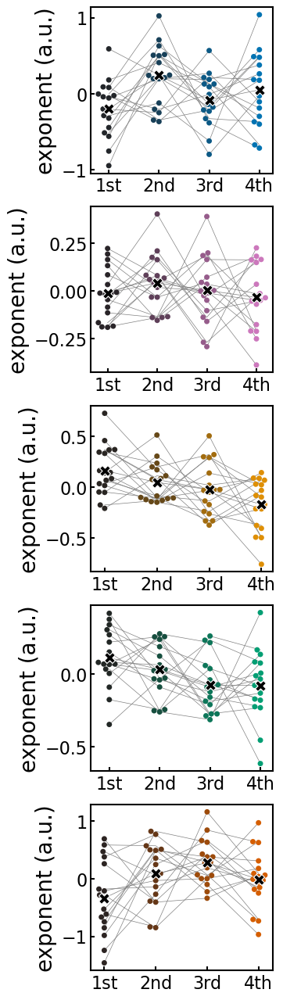

In [675]:
import seaborn
ColStage = [seaborn.color_palette("colorblind")[0], seaborn.color_palette("colorblind")[4],
            seaborn.color_palette("colorblind")[1], 
        seaborn.color_palette("colorblind")[2],seaborn.color_palette("colorblind")[3]]

titles =  ['1st','2nd', '3rd','4th']
fig = plt.figure(figsize=(3, 16))  

All_stages = [N1q,N2q,N3q,RMq,WKq]
alphas = np.linspace(0.1, 1, 5)
weights = np.arange(1, 6)
i=0
for x in All_stages:

    ax = fig.add_subplot(5,1, i+1)

    s1za = np.nanmean(x[0,:,:],1)
    s1za[np.isnan(s1za)] = np.nanmean(s1za)

    s2za = np.nanmean(x[1,:,:],1)
    s2za[np.isnan(s2za)] = np.nanmean(s2za)

    s3za = np.nanmean(x[2,:,:],1)
    s3za[np.isnan(s3za)] = np.nanmean(s3za)

    s4za = np.nanmean(x[3,:,:],1)
    s4za[np.isnan(s4za)] = np.nanmean(s4za)

    
    array_list = [s1za, s2za,s3za, s4za]
    
    Col = ColStage[0]
    
    
    # Plotting
    ax = seaborn.swarmplot(data= array_list, color = ColStage[i])
    plt.ylabel(titles, fontsize = 20)
    ax.set_xticklabels(titles, fontsize = 20)
    seaborn.scatterplot(x=[0,1,2,3], y=[np.nanmean(array_list[0]),np.nanmean(array_list[1]),np.nanmean(array_list[2]),
                                          np.nanmean(array_list[3])]
                                          , marker='X', color='black', s=100, zorder=4, legend=False);
    plt.plot([array_list[0], array_list[1], array_list[2], array_list[3]], color = 'grey', linewidth = 0.5);
   
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.ylabel('exponent (a.u.)', fontsize=20)
    
    #if i == 4:
      #  plt.ylim([0.6, 4.4])

    ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['right'].set_linewidth(1.5)
    ax.spines['top'].set_linewidth(1.5)
    
    i=i+1
#plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_sleep_cycles_30s.svg", dpi = 600)

# STATS

In [676]:
# Function to perofrm stats

import pandas as pd
from scipy.stats import friedmanchisquare
from scikit_posthocs import posthoc_dunn
from pingouin import compute_effsize


def compute_z_values(p_values, n):
    """
    Compute Z-values based on the provided p-values and sample size.

    Parameters:
    - p_values: Array of p-values.
    - n: Sample size.

    Returns:
    - Array of Z-values.
    """
    z_values = np.abs(np.sqrt(2) * np.arctanh(np.sqrt(p_values / 2)))
    return z_values

# function for the effect size of post-hoc dunn using Cliff's delta
def compute_cliffs_delta(data1, data2):
    """
    Compute Cliff's Delta effect size for pairwise comparisons.

    Parameters:
    - data1, data2: Arrays representing two samples.

    Returns:
    - Cliff's Delta effect size.
    """
   
    N = len(data1) * len(data2)
    m, n = np.sum(data1 > data2), np.sum(data1 < data2)
    delta = (m - n) / N
    return delta

# bonferroni multiple comparison
def bonferroni_correction(p_values, num_comparisons):
    """
    Apply Bonferroni correction to p-values.

    Parameters:
    - p_values: Array of p-values.
    - num_comparisons: Number of pairwise comparisons.

    Returns:
    - Array of corrected p-values.
    """
    return np.minimum(p_values * num_comparisons, 1)

# MAIN FUNCTION (FRIEDMAN TEST FOLLOWED BY DUNN's)
def friedman_dunns(data):
    """
    Perform Friedman test followed by Dunn's post-hoc test.

    Parameters:
    - data: DataFrame where each column represents a treatment/sample.

    Returns:
    - Results DataFrame containing Friedman test statistics and Dunn's post-hoc results.
    """
    # Friedman test
    friedman_result = friedmanchisquare(*[data[col] for col in data.columns])
    W = friedman_result.statistic / (len(data)*(len(data.columns)-1))
    # Dunn's post-hoc test
    posthoc_result = posthoc_dunn(data.melt(var_name='groups', value_name='values'), val_col='values', group_col='groups')
     
    # Compute Z-values
    z_values = compute_z_values(posthoc_result.values, len(data))
    
    # Initialize a DataFrame for effect sizes
    effect_sizes = pd.DataFrame(index=data.columns, columns=data.columns)

    # Compute effect sizes using Cliff's Delta
    for i, col1 in enumerate(data.columns):
        for j, col2 in enumerate(data.columns):
            if i < j:
                effect_sizes.loc[col1, col2] = compute_cliffs_delta(data[col1], data[col2])
                effect_sizes.loc[col2, col1] = -effect_sizes.loc[col1, col2]
                
    # Apply Bonferroni correction to p-values
    num_comparisons = len(data.columns) * (len(data.columns) - 1) / 2
    cpv  = bonferroni_correction(posthoc_result.values, num_comparisons)
    corrected_p_values =  pd.DataFrame(cpv)


    return friedman_result, W, posthoc_result, z_values, effect_sizes, corrected_p_values


In [695]:
#N1
from pandas.plotting import table 

# KNEE - STATS
lis1 = [np.nanmean(N1q[0,:,:],1), np.nanmean(N1q[1,:,:],1), np.nanmean(N1q[2,:,:],1), np.nanmean(N1q[3,:,:],1)]

data = pd.DataFrame(np.transpose(lis1))

friedman_result, W, posthoc_result, z_values, effect_sizes, corrected_p_values = friedman_dunns(data)


In [697]:
# KNEE - STATS
lis1 = [np.nanmean(N2q[0,:,:],1), np.nanmean(N2q[1,:,:],1), np.nanmean(N2q[2,:,:],1), np.nanmean(N2q[3,:,:],1)]

data = pd.DataFrame(np.transpose(lis1))

friedman_result, W, posthoc_result, z_values, effect_sizes, corrected_p_values = friedman_dunns(data)

In [699]:
# KNEE - STATS
lis1 = [np.nanmean(N3q[0,:,:],1), np.nanmean(N3q[1,:,:],1), np.nanmean(N3q[2,:,:],1), np.nanmean(N3q[3,:,:],1)]

data = pd.DataFrame(np.transpose(lis1))

friedman_result, W, posthoc_result, z_values, effect_sizes, corrected_p_values = friedman_dunns(data)

In [701]:
# KNEE - STATS
lis1 = [np.nanmean(RMq[0,:,:],1), np.nanmean(RMq[1,:,:],1), np.nanmean(RMq[2,:,:],1), np.nanmean(RMq[3,:,:],1)]

data = pd.DataFrame(np.transpose(lis1))

friedman_result, W, posthoc_result, z_values, effect_sizes, corrected_p_values = friedman_dunns(data)

In [703]:
# KNEE - STATS
lis1 = [np.nanmean(WKq[0,:,:],1), np.nanmean(WKq[1,:,:],1), np.nanmean(WKq[2,:,:],1), np.nanmean(WKq[3,:,:],1)]

data = pd.DataFrame(np.transpose(lis1))

friedman_result, W, posthoc_result, z_values, effect_sizes, corrected_p_values = friedman_dunns(data)

In [704]:
friedman_result

FriedmanchisquareResult(statistic=6.529411764705856, pvalue=0.08850976557025143)

# KNEE?

In [435]:
# calculate knee frequency

# KNEE freqs
from fooof.utils.params import compute_knee_frequency

knees = compute_knee_frequency(Knee_k, Slope_k)  



In [441]:
# Use the appropriate model
N1k = knees[0,:,:]
N2k = knees[1,:,:]
N3k = knees[2,:,:]
RMk = knees[4,:,:]
WKk = knees[3,:,:]

# get the same number of epochs for all subjects
#################################################
N1nn=np.zeros(17)*np.nan
N2nn=np.zeros(17)*np.nan
N3nn=np.zeros(17)*np.nan
RMnn=np.zeros(17)*np.nan
WKnn=np.zeros(17)*np.nan

for i in np.arange(17):
    x1 = N1k[i,]
    N1nn[i] = len(x1[~np.isnan(x1)])
    x2 = N2k[i,]
    N2nn[i] = len(x2[~np.isnan(x2)])
    x3 = N3k[i,]
    N3nn[i] = len(x3[~np.isnan(x3)])
    x4 = RMk[i,]
    RMnn[i] = len(x4[~np.isnan(x4)])
    x5 = WKk[i,]
    WKnn[i] = len(x5[~np.isnan(x5)])
    
mN1 = min(N1nn)
mN2 = min(N2nn)
mN3 = min(N3nn)
mRM = min(RMnn)
mWK = min(WKnn)

N1z2 = np.delete(N1k, slice(int(mN1+1),5000), 1)  # delete second row of A
N2z2 = np.delete(N2k, slice(int(mN2+1),5000), 1)  # delete second row of A
N3z2 = np.delete(N3k, slice(int(mN3+1),5000), 1)  # delete second row of A
RMz2 = np.delete(RMk, slice(int(mRM+1),5000), 1)  # delete second row of A
WKz2 = np.delete(WKk, slice(int(mWK+1),5000), 1)  # delete second row of A


In [442]:
# Plot without correction
N1za = np.nanmean(N1z2,0)
N1zb = N1za[~np.isnan(N1za)]

N2za = np.nanmean(N2z2,0)
N2zb = N2za[~np.isnan(N2za)]

N3za = np.nanmean(N3z2,0)
N3zb = N3za[~np.isnan(N3za)]

RMza = np.nanmean(RMz2,0)
RMzb = RMza[~np.isnan(RMza)]

WKza = np.nanmean(WKz2,0)
WKzb = WKza[~np.isnan(WKza)]

#find line of best fit
a1, b1 = np.polyfit(np.arange(len(N1zb)), N1zb, 1)
a2, b2 = np.polyfit(np.arange(len(N2zb)), N2zb, 1)
a3, b3 = np.polyfit(np.arange(len(N3zb)), N3zb, 1)
a4, b4 = np.polyfit(np.arange(len(RMzb)), RMzb, 1)
a5, b5 = np.polyfit(np.arange(len(WKzb)), WKzb, 1)

plt.figure(figsize=(20, 10), dpi=600)
# Plotting
plt.scatter(np.arange(len(N1zb)),N1zb, color = 'grey', s =25)
plt.scatter(np.arange(len(N2zb)),N2zb, color = 'orange', s =25)
plt.scatter(np.arange(len(N3zb)),N3zb, color = 'green', s =25)
plt.scatter(np.arange(len(RMzb)),RMzb, color = 'r', s =25)
plt.scatter(np.arange(len(WKzb)),WKzb, color = 'b', s =25)

plt.plot(np.arange(len(WKzb)), a5*np.arange(len(WKzb))+b5,color = 'b',label='W', linewidth = 5)
plt.plot(np.arange(len(N1zb)), a1*np.arange(len(N1zb))+b1,color = 'grey',label='N1', linewidth = 5)
plt.plot(np.arange(len(N2zb)), a2*np.arange(len(N2zb))+b2,color = 'orange',label='N2', linewidth = 5)
plt.plot(np.arange(len(N3zb)), a3*np.arange(len(N3zb))+b3,color = 'green',label='N3', linewidth = 5)
plt.plot(np.arange(len(RMzb)), a4*np.arange(len(RMzb))+b4,color = 'r',label='REM', linewidth = 5)

plt.legend(fontsize=40)
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.ylabel('exponent',fontsize=40)
plt.xlabel('epoch number',fontsize=40)
plt.title('Knee through the night - non-normalized - Min epochs / stage', fontsize = 40)

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
ax.spines['bottom'].set_linewidth(3.5)
ax.spines['left'].set_linewidth(3.5)


In [456]:
#zscore
N1z3=np.zeros([17,int(mN1)+1])*np.nan
N2z3=np.zeros([17,int(mN2)+1])*np.nan
N3z3=np.zeros([17,int(mN3)+1])*np.nan
RMz3=np.zeros([17,int(mRM)+1])*np.nan
WKz3=np.zeros([17,int(mWK)+1])*np.nan 

for i in np.arange(17):
    N1z3[i, 0:int(mN1)+1] = stats.zscore(N1z2[i,], nan_policy='omit')
    N2z3[i, 0:int(mN2)+1] = stats.zscore(N2z2[i,], nan_policy='omit')
    N3z3[i, 0:int(mN3)+1] = stats.zscore(N3z2[i,], nan_policy='omit')
    RMz3[i, 0:int(mRM)+1] = stats.zscore(RMz2[i,], nan_policy='omit')
    WKz3[i, 0:int(mWK)+1] = stats.zscore(WKz2[i,], nan_policy='omit')

In [458]:
N3z3

array([[ 0.68424424, -0.74306934,  0.49097604, ...,  1.49762437,
         0.13671064, -0.64093223],
       [-0.68152466, -0.47512362,         nan, ...,  1.77638934,
         2.3355988 , -0.57780807],
       [ 0.558136  , -0.01815354, -0.1576188 , ..., -0.55695393,
                nan, -0.77479308],
       ...,
       [-0.12151015,  2.94893931,  2.07403147, ...,  0.66173181,
         0.83706087, -0.34722943],
       [ 0.44056507,  1.97654277,  0.66891082, ..., -0.52212057,
        -1.21699312, -0.75922211],
       [ 1.81191946,  2.22953399, -0.16704327, ...,  0.9927941 ,
         1.43255721,  2.38443621]])

In [459]:
N1za = np.nanmean(N1z3,0)
N1zb = N1za[~np.isnan(N1za)]

N2za = np.nanmean(N2z3,0)
N2zb = N2za[~np.isnan(N2za)]

N3za = np.nanmean(N3z3,0)
N3zb = N3za[~np.isnan(N3za)]

RMza = np.nanmean(RMz3,0)
RMzb = RMza[~np.isnan(RMza)]

WKza = np.nanmean(WKz3,0)
WKzb = WKza[~np.isnan(WKza)]




#find line of best fit
a1, b1 = np.polyfit(np.arange(len(N1zb)), N1zb, 1)
a2, b2 = np.polyfit(np.arange(len(N2zb)), N2zb, 1)
a3, b3 = np.polyfit(np.arange(len(N3zb)), N3zb, 1)
a4, b4 = np.polyfit(np.arange(len(RMzb)), RMzb, 1)
a5, b5 = np.polyfit(np.arange(len(WKzb)), WKzb, 1)

plt.figure(figsize=(20, 10), dpi=600)
# Plotting
plt.scatter(np.arange(len(N1zb)),N1zb, color = 'grey', s =45)
plt.scatter(np.arange(len(N2zb)),N2zb, color = 'orange', s =45)
plt.scatter(np.arange(len(N3zb)),N3zb, color = 'green', s =45)
plt.scatter(np.arange(len(RMzb)),RMzb, color = 'r', s =45)
plt.scatter(np.arange(len(WKzb)),WKzb, color = 'b', s =45)

plt.plot(np.arange(len(WKzb)), a5*np.arange(len(WKzb))+b5,color = 'b',label='W', linewidth = 5)
plt.plot(np.arange(len(N1zb)), a1*np.arange(len(N1zb))+b1,color = 'grey',label='N1', linewidth = 5)
plt.plot(np.arange(len(N2zb)), a2*np.arange(len(N2zb))+b2,color = 'orange',label='N2', linewidth = 5)
plt.plot(np.arange(len(N3zb)), a3*np.arange(len(N3zb))+b3,color = 'green',label='N3', linewidth = 5)
plt.plot(np.arange(len(RMzb)), a4*np.arange(len(RMzb))+b4,color = 'r',label='REM', linewidth = 5)

plt.legend(fontsize=40)
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.ylabel('exponent (z-score)',fontsize=40)
plt.xlabel('epoch number',fontsize=40)
plt.title('Exponent through the night - normalized - Min epochs / stage', fontsize = 40)

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
ax.spines['bottom'].set_linewidth(3.5)
ax.spines['left'].set_linewidth(3.5)

#plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_exponent_thru_night_30s_FIXED.svg", dpi = 600)

# CYCLES
## Divide night into 4 quartiles

In [483]:
q1=np.zeros([17,500])*np.nan
q2=np.zeros([17,500])*np.nan
q3=np.zeros([17,500])*np.nan
q4=np.zeros([17,500])*np.nan

for i in np.arange(17):
    
    X = Slope_k_fullnight[i,~np.isnan(Slope_k_fullnight[i,:])]
    quadX = round(len(X)/4)
    q1[i,0:quadX] = X[0:quadX]
    q2[i,0:quadX] = X[quadX:quadX*2]
    q3[i,0:quadX] = X[quadX*2:quadX*3]
    q4[i,0:len(X[quadX*3:quadX*4])] = X[quadX*3:quadX*4]

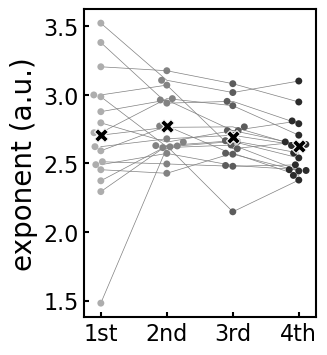

In [488]:
ColStage = [seaborn.color_palette("Greys")[2], seaborn.color_palette("Greys")[3],
        seaborn.color_palette("Greys")[4],seaborn.color_palette("Greys")[5]]

titles =  ['1st','2nd', '3rd','4th']

fig = plt.figure(figsize=(3, 4))  


s1za = np.nanmean(q1,1)
s1za[np.isnan(s1za)] = np.nanmean(s1za)

s2za = np.nanmean(q2,1)
s2za[np.isnan(s2za)] = np.nanmean(s2za)

s3za = np.nanmean(q3,1)
s3za[np.isnan(s3za)] = np.nanmean(s3za)

s4za = np.nanmean(q4,1)
s4za[np.isnan(s4za)] = np.nanmean(s4za)

    
array_list = [s1za, s2za,s3za, s4za]
    
Col = ColStage[0]
    
    
# Plotting
ax = seaborn.swarmplot(data= array_list, palette = ColStage)
plt.ylabel(titles, fontsize = 20)
ax.set_xticklabels(titles, fontsize = 20)
seaborn.scatterplot(x=[0,1,2,3], y=[np.nanmean(array_list[0]),np.nanmean(array_list[1]),np.nanmean(array_list[2]),
                                          np.nanmean(array_list[3])]
                                          , marker='X', color='black', s=100, zorder=4, legend=False);
plt.plot([array_list[0], array_list[1], array_list[2], array_list[3]], color = 'grey', linewidth = 0.5);
   
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('exponent (a.u.)', fontsize=20)
    
#plt.ylim([0, 7])

ax.tick_params(axis='both', which='both', direction='in', width=1.5, labelsize=16)  # Customize tick properties
ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_linewidth(1.5)
ax.spines['right'].set_linewidth(1.5)
ax.spines['top'].set_linewidth(1.5)
    

#plt.savefig("/home/b1044271/Columbia/Plots/NOV23/EEG_sleep_cycles_30s.svg", dpi = 600)